# Iterative Soundbite on NYC Property Sales Dataset
**To maximize ROI, purchase property in Manhattan built before 1940 or after 2000 that is 4,700+ gross square feet around $990K (median) in price.  *By the end of this analysis we will have identified an actual property as a good investment based on price*.**

* **Purpose:** Maximize ROI per property investment.
* **Criteria for success:** Identify a prime property to invest in based on acquisition price.
* **Scope:** Explore and Analyze the relationship between NYC Property: Price, Age, Square Footage, and Neighborhood .
* **Constraints:** data must be cleaned and visualized appropriately to map relevant statistics to business solutions. 
* **Key data sources:** Kaggle NYC Property Sales
https://www.kaggle.com/new-york-city/nyc-property-sales?fbclid=IwAR2_KPGJOLJGscrpy9IumrFMZPoeVLE2M__W3T2UVsiAV5rqBSdROK-KrKU

### Important
In order to most efficaciously observe the interactive visuals contained in this Jupyter Notebook, please copy and paste the link to this GitHub notebook into http://nbviewer.jupyter.org/, which will present you with a richer interactive view of this notebook. 

In [1]:
import numpy as np
import pandas as pd
import os
import warnings
warnings.filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set()

import random
import operator

In [2]:
from datetime import date
from scipy.stats import skew 
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff


In [4]:
df = pd.read_csv('nyc-rolling-sales.csv')

In [5]:
df

,Unnamed: 0,BOROUGH,NEIGHBORHOOD,BUILDING CLASS CATEGORY,TAX CLASS AT PRESENT,BLOCK,LOT,EASE-MENT,BUILDING CLASS AT PRESENT,ADDRESS,...,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,TAX CLASS AT TIME OF SALE,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE
0,4,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,392,6,,C2,153 AVENUE B,...,5,0,5,1633,6440,1900,2,C2,6625000,2017-07-19 00:00:00
1,5,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,26,,C7,234 EAST 4TH STREET,...,28,3,31,4616,18690,1900,2,C7,-,2016-12-14 00:00:00
2,6,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2,399,39,,C7,197 EAST 3RD STREET,...,16,1,17,2212,7803,1900,2,C7,-,2016-12-09 00:00:00
3,7,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2B,402,21,,C4,154 EAST 7TH STREET,...,10,0,10,2272,6794,1913,2,C4,3936272,2016-09-23 00:00:00
4,8,1,ALPHABET CITY,07 RENTALS - WALKUP APARTMENTS,2A,404,55,,C2,301 EAST 10TH STREET,...,6,0,6,2369,4615,1900,2,C2,8000000,2016-11-17 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
84543,8409,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,34,,B9,37 QUAIL LANE,...,2,0,2,2400,2575,1998,1,B9,450000,2016-11-28 00:00:00
84544,8410,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7349,78,,B9,32 PHEASANT LANE,...,2,0,2,2498,2377,1998,1,B9,550000,2017-04-21 00:00:00
84545,8411,5,WOODROW,02 TWO FAMILY DWELLINGS,1,7351,60,,B2,49 PITNEY AVENUE,...,2,0,2,4000,1496,1925,1,B2,460000,2017-07-05 00:00:00
84546,8412,5,WOODROW,22 STORE BUILDINGS,4,7100,28,,K6,2730 ARTHUR KILL ROAD,...,0,7,7,208033,64117,2001,4,K6,11693337,2016-12-21 00:00:00


In [6]:
df.shape

(84548, 22)

In [7]:
#setting df_raw in case we need to revist the raw data frame b4 alterations
df_raw = df

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 22 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   Unnamed: 0                      84548 non-null  int64 
 1   BOROUGH                         84548 non-null  int64 
 2   NEIGHBORHOOD                    84548 non-null  object
 3   BUILDING CLASS CATEGORY         84548 non-null  object
 4   TAX CLASS AT PRESENT            84548 non-null  object
 5   BLOCK                           84548 non-null  int64 
 6   LOT                             84548 non-null  int64 
 7   EASE-MENT                       84548 non-null  object
 8   BUILDING CLASS AT PRESENT       84548 non-null  object
 9   ADDRESS                         84548 non-null  object
 10  APARTMENT NUMBER                84548 non-null  object
 11  ZIP CODE                        84548 non-null  int64 
 12  RESIDENTIAL UNITS               84548 non-null

We are unable to count missing values because of the current data types. Before preforming transformations, let's drop any irrelevant columns...

In [9]:
# count the number of missing values. 
#...how much data cleaning do we need to do...
df.isna().sum()

Unnamed: 0                        0
BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
EASE-MENT                         0
BUILDING CLASS AT PRESENT         0
ADDRESS                           0
APARTMENT NUMBER                  0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
SALE DATE                         0
dtype: int64

In [9]:
# according to the data definition of terms
## we will remove Ease-ment AND
# the Unnamed : 0 column . Unnamed does not contain any useful information, so it will be removed

According to the [New York department of Finance](https://www1.nyc.gov/assets/finance/downloads/pdf/07pdf/glossary_rsf071607.pdf), Ease-ment is "is a right, such as a right of way, which allows an entity to make limited use of another’s real property. For example: MTA railroad tracks that run across a portion of another property". Also, the Unnamed column is not mentioned and was likely used for iterating through records. So, those two columns are removed for now.

In [10]:
df.drop(['Unnamed: 0', 'EASE-MENT'],1, inplace=True)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84548 entries, 0 to 84547
Data columns (total 20 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   BOROUGH                         84548 non-null  int64 
 1   NEIGHBORHOOD                    84548 non-null  object
 2   BUILDING CLASS CATEGORY         84548 non-null  object
 3   TAX CLASS AT PRESENT            84548 non-null  object
 4   BLOCK                           84548 non-null  int64 
 5   LOT                             84548 non-null  int64 
 6   BUILDING CLASS AT PRESENT       84548 non-null  object
 7   ADDRESS                         84548 non-null  object
 8   APARTMENT NUMBER                84548 non-null  object
 9   ZIP CODE                        84548 non-null  int64 
 10  RESIDENTIAL UNITS               84548 non-null  int64 
 11  COMMERCIAL UNITS                84548 non-null  int64 
 12  TOTAL UNITS                     84548 non-null

In [12]:
# try to check number of missing values now...
df.isna().sum()

BOROUGH                           0
NEIGHBORHOOD                      0
BUILDING CLASS CATEGORY           0
TAX CLASS AT PRESENT              0
BLOCK                             0
LOT                               0
BUILDING CLASS AT PRESENT         0
ADDRESS                           0
APARTMENT NUMBER                  0
ZIP CODE                          0
RESIDENTIAL UNITS                 0
COMMERCIAL UNITS                  0
TOTAL UNITS                       0
LAND SQUARE FEET                  0
GROSS SQUARE FEET                 0
YEAR BUILT                        0
TAX CLASS AT TIME OF SALE         0
BUILDING CLASS AT TIME OF SALE    0
SALE PRICE                        0
SALE DATE                         0
dtype: int64

It looks like empty records are not being treated as NA (missing) values in the existing default parameters. We will have to convert columns into appropriately relevant data types to count for missing values. We can simultaniously make enhancements to the data time feilds in the process for preforming any future desired time series analysis.

In [13]:
# first check ALL unique values
for col in df.columns:
    print(col, df[col].nunique())
    


BOROUGH 5
NEIGHBORHOOD 254
BUILDING CLASS CATEGORY 47
TAX CLASS AT PRESENT 11
BLOCK 11566
LOT 2627
BUILDING CLASS AT PRESENT 167
ADDRESS 67563
APARTMENT NUMBER 3989
ZIP CODE 186
RESIDENTIAL UNITS 176
COMMERCIAL UNITS 55
TOTAL UNITS 192
LAND SQUARE FEET 6062
GROSS SQUARE FEET 5691
YEAR BUILT 158
TAX CLASS AT TIME OF SALE 4
BUILDING CLASS AT TIME OF SALE 166
SALE PRICE 10008
SALE DATE 364


## Transforming Data Types to Preform Numerical Analysis 
We want to preform statistical analysis on: Sale Price, Groos Square Feet, Land Square Feet.

We are going to convert the columns SALE PRICE, LAND SQUARE FEET, GROSS SQUARE FEET,  AND BOROUGH into the numeric data type. Pandas unpacked them out of the box as objects. We want the numeric data type so we can use approriate data tools.

SALE DATE will become datetime format. This is to preform any future time series analysis. 

The following will be made into categorical data: NEIGHBORHOOD, BUILDING CLASS CATEGORY, TAX CLASS AT PRESENT, BUILDING CLASS AT PRESENT, BUILDING CLASS AT TIME OF SALE, TAX CLASS AT TIME OF SALE. *more information on the Pandas categorical data type can be found here:*[Practical Business Python, Using the Pandas Category Data Type](https://pbpython.com/pandas_dtypes_cat.html#:~:text=The%20category%20data%20type%20in%20pandas%20is%20a,why%20do%20we%20care%20about%20using%20categorical%20values%3F)


In [14]:
numeric = ['LAND SQUARE FEET', 'GROSS SQUARE FEET', 'SALE PRICE', 'BOROUGH']
for col in numeric: # coerce for missing values
    df[col] = pd.to_numeric(df[col], errors='coerce')
    
categorical = ['NEIGHBORHOOD', 'BUILDING CLASS CATEGORY', 'TAX CLASS AT PRESENT','BUILDING CLASS AT PRESENT','BUILDING CLASS AT TIME OF SALE','TAX CLASS AT TIME OF SALE']
for col in categorical:
    df[col] = df[col].astype('category')
    
df['SALE DATE']= pd.to_datetime(df['SALE DATE'], errors='coerce')

Our dataset (df) should now be ready to check for missing numeric values in the areas we want to preform analysis on. let's see...

In [15]:
df.isna().sum()

BOROUGH                               0
NEIGHBORHOOD                          0
BUILDING CLASS CATEGORY               0
TAX CLASS AT PRESENT                  0
BLOCK                                 0
LOT                                   0
BUILDING CLASS AT PRESENT             0
ADDRESS                               0
APARTMENT NUMBER                      0
ZIP CODE                              0
RESIDENTIAL UNITS                     0
COMMERCIAL UNITS                      0
TOTAL UNITS                           0
LAND SQUARE FEET                  26252
GROSS SQUARE FEET                 27612
YEAR BUILT                            0
TAX CLASS AT TIME OF SALE             0
BUILDING CLASS AT TIME OF SALE        0
SALE PRICE                        14561
SALE DATE                             0
dtype: int64

We can see the number of missing values. Now let's visualize this as a percent of total using Pandas.

In [16]:
missing = df.isnull().sum()/len(df)*100

#if missing values exist, print the number and % it represents of its total
print(pd.DataFrame([missing[missing>0],pd.Series(df.isnull().sum()[df.isnull().sum()>1000])], index=['percent missing','total missing']))

                 LAND SQUARE FEET  GROSS SQUARE FEET   SALE PRICE
percent missing         31.049818          32.658372     17.22217
total missing        26252.000000       27612.000000  14561.00000


Around 30% of GROSS SF and LAND SF are missing. Furthermore, around 17% of SALE PRICE is also missing. The below Seaborn heatmap indicates which parts of the table are missing values in yellow.

<AxesSubplot:>

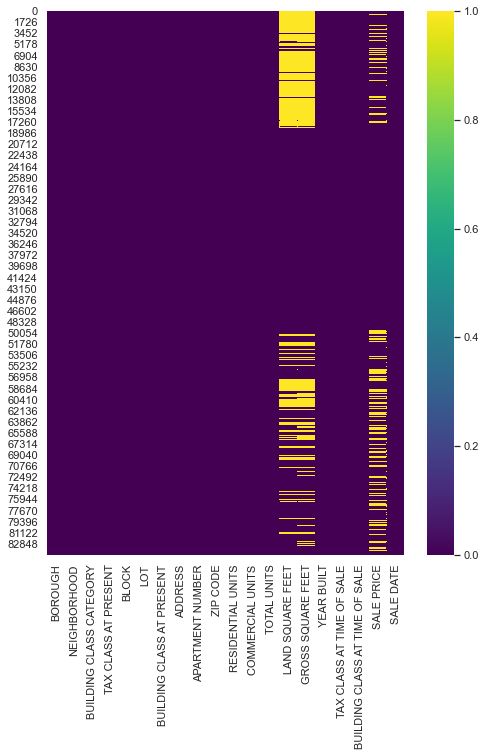

In [17]:
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

We can see our missing values in YELLOW.

are there duplicate rows?

In [18]:
sum(df.duplicated(df.columns))

765

lets drop the duplicates and run the heatmap again

In [19]:
df = df.drop_duplicates(df.columns,keep='last')
sum(df.duplicated(df.columns))

0

we dropped 765 duplicates, and now there are zero duplicates.
let's run the heatmap again and see what happened...

<AxesSubplot:>

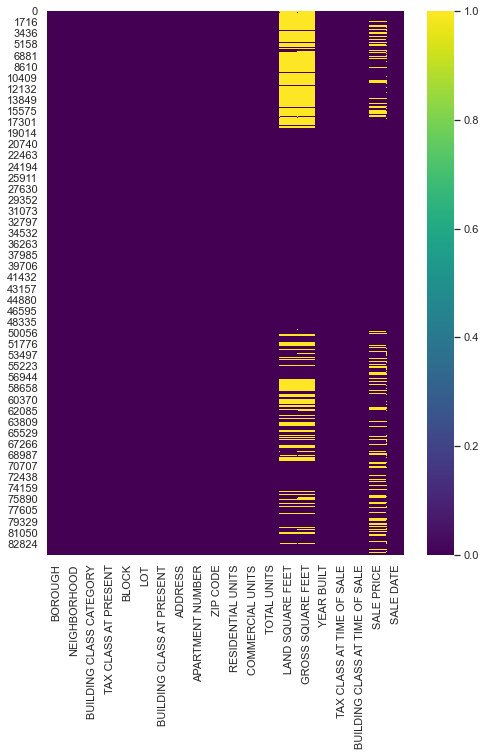

In [20]:
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

No significant changes but we have cleaned our data of duplicates. 



I am most interested in preforming initial exploratory analysis and visualization on the SALE PRICE column. So I've decided to drop the rows with missing Sale Price values. I have not decided what to do with the missing Gross Square Footage /Land Square Footage missing values yet.

For now we will drop 17% of the data with missing Sale Price values. Keeping the rows with missing Square Footage values (around 31% of the data). We can circle back around on what to do with missing Square Footage values later. For now I want to preform statistical analysis with the SALE PRICE column and keep as many rows with SALE PRICE as possible. . 

Let’s set the bouough names , get rid of rows with missing [SALE PRICE] values, and preform exploratory analysis on pricing…

In [21]:
#set the Borough names
df['BOROUGH'][df['BOROUGH'] == 1] = 'Manhattan'
df['BOROUGH'][df['BOROUGH'] == 2] = 'Bronx'
df['BOROUGH'][df['BOROUGH'] == 3] = 'Brooklyn'
df['BOROUGH'][df['BOROUGH'] == 4] = 'Queens'
df['BOROUGH'][df['BOROUGH'] == 5] = 'Staten Island'

In [22]:
#remove the rows with missing SALE PRICE
df = df[df['SALE PRICE'].notnull()]
#count how many rows we have left
len(df)

69607

After removing the missing values in SALE PRICE we are left with 70k observations, down from 85k at the very start.

Now, let's start building visulaizations to see what we can do with the pricing data.  


In [23]:
# overview of general descriptive statistics on the cleaned data
df.describe()

,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,SALE PRICE
count,69607.000000,69607.000000,69607.000000,69607.000000,69607.000000,69607.000000,4.844900e+04,4.790000e+04,69607.000000,6.960700e+04
mean,4199.890140,374.580473,10741.159323,1.875070,0.164121,2.059319,3.544802e+03,3.528707e+03,1799.852184,1.280703e+06
std,3431.897518,656.232024,1264.804508,14.291398,8.997236,16.992716,3.973875e+04,2.920564e+04,520.099311,1.143036e+07
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000e+00
25%,1350.000000,22.000000,10306.000000,0.000000,0.000000,0.000000,1.425000e+03,8.160000e+02,1920.000000,2.300000e+05
50%,3378.000000,50.000000,11209.000000,1.000000,0.000000,1.000000,2.150000e+03,1.620000e+03,1938.000000,5.330000e+05
75%,6192.000000,820.000000,11249.000000,2.000000,0.000000,2.000000,3.100000e+03,2.508000e+03,1965.000000,9.500000e+05
max,16319.000000,9106.000000,11694.000000,1844.000000,2261.000000,2261.000000,4.252327e+06,3.750565e+06,2017.000000,2.210000e+09


In the dataset we have SALE PRICE with 0 as value and some very small numbers, which the Kaggle documenation suggests are cases of transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement. 

Before any cleaning of the SALE PRICE column, the average (mean) is 1.28M, the median (50th percentile) is 533k, the 25th percentile is 230k, the 75th percentile is 950k. the gap between the mean & median alludes to more data cleaning is necessary...especially large outliers above 500M...but also what to do with these zero values....

We want to further explore and visualize where outliers may exist specifically in the SALES PRICE column. Given that there may be a significant number of zero values (transfer of deeds, etc) We will use matplotlib and seaborn to visualize histograms, KDE(kernal density estimation), rug map, scatter plots, box plots, and other visuals to observe values that may deviate from a standard and/or normal distribution.

In [24]:
#making a second copy of the raw dataframe in case we make any changes to df_raw
# this contains cleaned data frame with no missing sales price values
# it contains values below $100k and above $5M (which are removed later in this project)
df_raw2 = df

In [25]:
len(df_raw2)

69607

## Visualizing Sales Price Values
Visualizing the SALE PRICE column to observe where we need to preform data cleaning...note that transactions exist in this data set from 0 to over $2Billion....

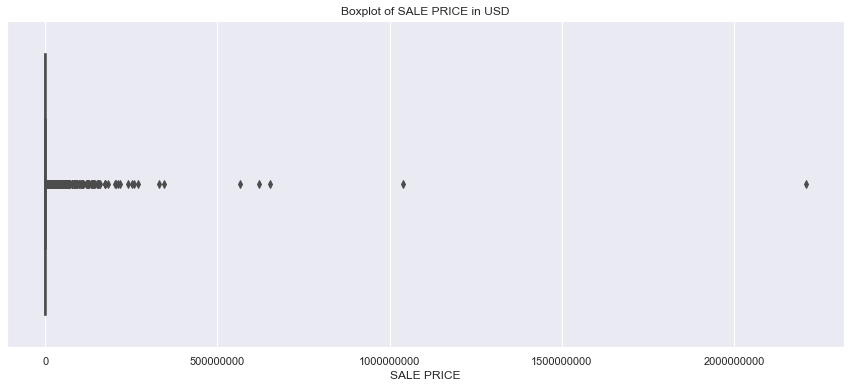

In [26]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.boxplot(x='SALE PRICE', data=df_raw2)
plt.ticklabel_format(style='plain', axis='x')
plt.title('Boxplot of SALE PRICE in USD')
plt.show()

You can visualize five significant outliers: three between 500M and 1B, one around 1B, one beyond 2B. Those are whale transactions...

Let's visualize a Seaborn Displot of the SALE PRICE column. This will give us a Histogram, KDE, and Rug Plot. having these three in one visual should help us drill in on where the majority of the data is located 'at' and 'around' (it's univariate distribution). The closer we can get to where the majority of the data is located 'at' or 'around', the closer we can get to visualizing a normal distribution model. 

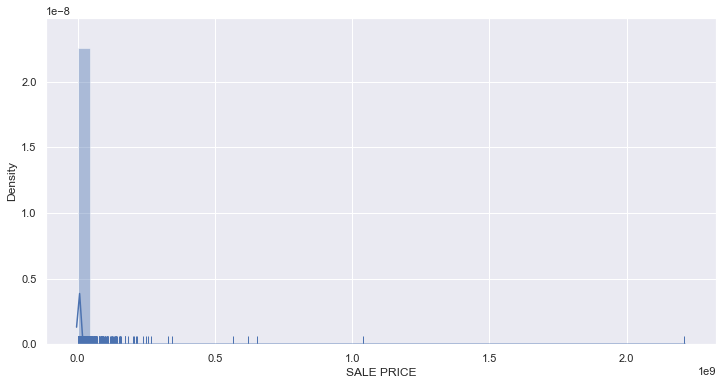

In [27]:
plt.figure(figsize=(12,6))
sns.distplot(df_raw2['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

The above visual identifies a spike (KDE: Kernal Density Estimation) in data what appears to be 'close to 0'. To be clear, the spike is showing a univariate distribtuion (looking at one variable's distribution, in this case SALE PRICE). Probability distribution is estimated to around this spike. We really need to view a closer observation of the 'peak' of the spike around 0.0. After several iterations, a clear oberservation of where the majority of data exists (univariate distribution) can be observed when viewing all transactions under 5M. When we cut the pricing data off at 5M, we see the observations where the majority of the pricing data exists around the seaborn KDE (the spike in the graph above).

For a refresher on these terms (SNS Distplot, KDE, Univariate Distribution) , and using sns.distplot, please see:

[SNS Distplot](https://www.youtube.com/watch?v=fJoR3QsfXa0&t=49s)

[SNS KDE](https://www.youtube.com/watch?v=DCgPRaIDYXA)

[Univariate Distribution](https://www.statisticshowto.com/univariate-distribution/)

*a short, sythesized explanation of how helpful the above Distplot visual is: "the spike (KDE) in the graph above helps us identify where we need to zoom in, to clean our data at / around."


## 0- 5M visualized in clarity. 



we create df5m to contain all transactions under $5M, and we can observe univariate distribution with increased clarity

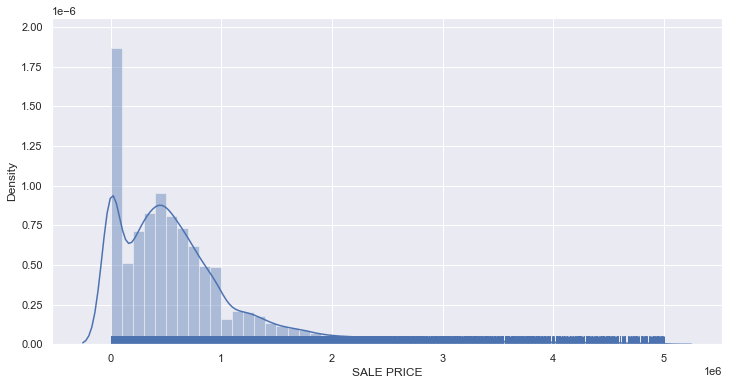

In [28]:

df5m= df_raw2[(df_raw2['SALE PRICE']<5000000)]
plt.figure(figsize=(12,6))
sns.distplot(df5m['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

we can see from the histogram above that an unusually high number of 0-100k values exists, many representing generational transfers of wealth, gifts, etc. as referenced in the kaggle documentation.

This visual helps us identify where the data exists...we see a large number of property sales between 0 and 100k...at this point we can understand why the kaggle documenation on this data set is specifically mentioned to state "many sales occur with a nonsensically small dollar amount..." reference: [NYC Property Sales](https://www.kaggle.com/new-york-city/nyc-property-sales?fbclid=IwAR0EiMVRtLrP2zp6bNfq9eZhqE2jKcZ_ui4moBdvELt0G8ImLdUk31NBSSo), which are cases of transfers of deeds between parties: for example, parents transferring ownership to their home to a child after moving out for retirement, and accordingly...also, according to the histogram above, at this point in the data iteration I feel we should clean the data of anything under 100k...anything under 100k seems too cheap for NYC from a general prospective...my sense is anything under 100k in NYC we will want remove for now...

this is my thought at this juncture:
-remove any transactions below 100k. this is where transfer of deeds take place
-remove any transactions above 5M. anything over 5M seems like a different animal according to the KDE above. (before doing this let's visulaize what's happening with data over 5M)

to justify cleaning the data from 100k - 5M, let's take a closer visual look at:
-transacations from 0-100k and 0 - 200k. as well as
-tansactions above 5M 

The histogram containing sales price between 100k to 5M looks like something closer to a normal distribution according to the above visual...However I also want to visualize the data under 200k and over 5M to see what it looks like...transactions above 5M are larger transactions than what the historgram above shows as 'normal' according to the KDE...


## 0- 100k and 0 - 200k visualized in clarity. 

First, let's look at transactions from 0 - 100k, then from 0 - 200k

**0- 100k**

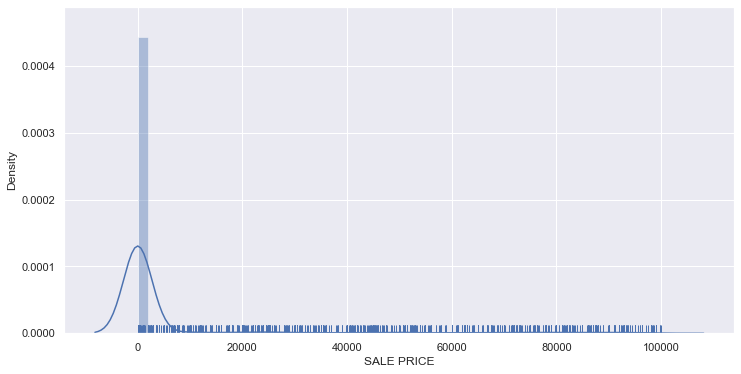

In [29]:
df_less_100k = df_raw2[(df_raw2['SALE PRICE']<100000)]
plt.figure(figsize=(12,6))
sns.distplot(df_less_100k['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

In [30]:
len(df_less_100k)

12560

the KDE shows univariate distribution still close to zero, most transactions are under $10k. there are 12,560 total instatances 

**0- 200k**

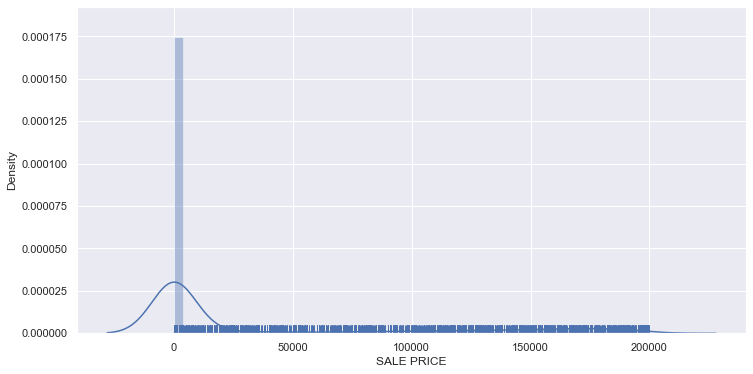

In [31]:
#show me the data between 0 - $200k
df_less_200k = df_raw2[(df_raw2['SALE PRICE']<200000)]
plt.figure(figsize=(12,6))
sns.distplot(df_less_200k['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

In [32]:
len(df_less_200k)

16003

interesting, that's 16k values....that's a lot...

still, univariate distribution still close to zero, most transactions are under $10k. there are 16,003 total instatances under 200k

At this point, I would really like to see what's going on with the data from 0-200k with **Plotly**. I need Plotly's interactive features live in this Jupyter Notebook to see exactly how many transactions are distributed around zero dollars....I also want to use SciPy with Plotly so we can obtain the skew metrics and visualize the Log graphs...we'll use this methodology later (SciPy + Plotly) to fully visulaize the normal distribution of transactions....

*..at this point I want to use Plotly to drill in on what's happening here....I want to see how many are 0 values...how many are 1 to 100k....100k to 200k....etc.*

In [33]:
from scipy.stats import skew 
trace1 = go.Histogram(
    x = df_less_200k['SALE PRICE'],
    name = 'SALE PRICE'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')

print("Skewness of Sale Price attribute is : {0}".format(skew(df['SALE PRICE'])))

trace2 = go.Histogram(
    x = np.log(df_less_200k['SALE PRICE']), 
    name = 'log(SALE PRICE)'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')
print("Skewness of Sale Price attribute after applying log is : {0}".format(skew(np.log(df['SALE PRICE']))))

fig = tls.make_subplots(rows=2, cols=1, subplot_titles=('Sale Prices', 'Sale Prices after applying log'));
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 2, 1);
fig['layout'].update(height=600, width=800,title='Histogram Plot for Sale Prices of Properties');
py.iplot(fig, filename='simple-subplot')


Skewness of Sale Price attribute is : 123.94046090154832
Skewness of Sale Price attribute after applying log is : nan


C:\Users\samue\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



**Extremely helpful insight here**...11k transactions from 0 to 5k. this is likely where the majority of transfer of deeds comes from...the very small number of sales transpiring between 5k - 100k also seem to be in a transfer alluded to in the kaggle documentation...anything under 100k seems to be too cheap. removing transactions under 100k seems to be approriate at this point.looking at the log chart you can see the number of occurances under 100k are very few. we see from the log graph that there is an increase in expontetiation approaching closer to 200k (as seen in the red log graph)...I feel comfortable now removing any transactions under 100k...89% of transactions under 100k are only just 0-$5k...11,195 out of 12,560 instances....

## Transactions Above 5M visualized in clarity. 
We visualized df5m as all data under 5M in price. 

We have also more narrowly visualized transactions from 0-200k. the decision was made to remove transactions under 100k, 89% of which are just 0-5k, representing deed transfers...

I also want to further visualize the distribution of 'more expensive transactions':
* Data over 500M 
* Data over 5M


having a visual of these expensive points (in some cases whale transactions) will empower greater comfortability in what points we are cleaning this dataset at...
we'll use df_raw2 for this...

Let's start by observing the transactions that happend over $500M

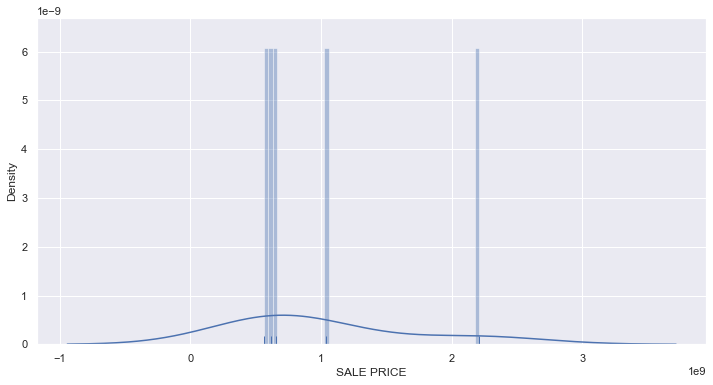

In [34]:
#show me the data over $500M
df_over_5HM = df_raw2[(df_raw2['SALE PRICE']>500000000)]
plt.figure(figsize=(12,6))
sns.distplot(df_over_5HM['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

the observation shows five total transactions over 500M

In [35]:
#correct. we can veiw these 5 large transactions in Tableua later....right now I don't want them to skew the data
len(df_over_5HM)

5

if desirable, we can veiw these 5 large NYC transactions above 500M in Tableua later....initally though I do not want them to skew my statistical data analysis...

Now let's observe all transactions that are above 5M 

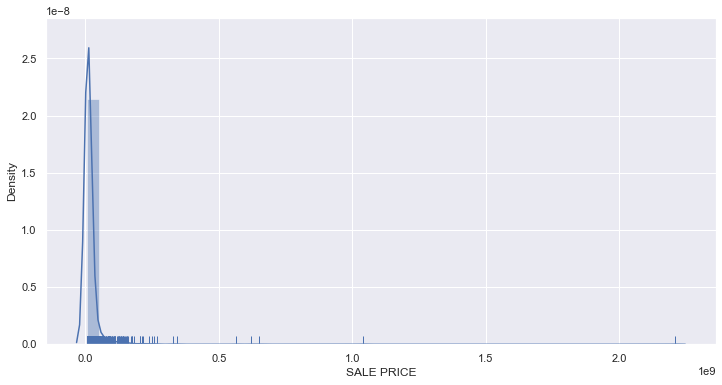

In [36]:
#show me the data over $5M
df_over_5m = df_raw2[(df_raw2['SALE PRICE']>5000000)]
plt.figure(figsize=(12,6))
sns.distplot(df_over_5m['SALE PRICE'], kde=True, bins=50, rug=True)
plt.show()

In [37]:
# 2324 transactions over 5M
len(df_over_5m)

2324

**There are 2324 transactions over 5M, which represent 3.33% of the 69,607 (row length) data set** ...the KDE above suggests univariate distribution closer to 5M...in other words, a large portion of data above 5M is actually close to 5M....
...although 3.33% is a small percentage of the data, I want to visualize the distribution spread of these larger transactions more closely...here is where the power of Plotly visualization comes in again...I can visualize these specifics to approriate cleaning my data at justified points (before uploading a clean data set via csv to Tableau)

In [38]:
#original df sanity check
len(df_raw2)

69607

In [39]:
# df 5M is all transatcions UNDER 5M
len(df5m)

67241

lets now take a look at transactions above 5M with Plotly...

In [40]:
trace1 = go.Histogram(
    x = df_over_5m['SALE PRICE'],
    name = 'SALE PRICE'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')

print("Skewness of Sale Price attribute is : {0}".format(skew(df['SALE PRICE'])))

trace2 = go.Histogram(
    x = np.log(df_over_5m['SALE PRICE']), 
    name = 'log(SALE PRICE)'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')
print("Skewness of Sale Price attribute after applying log is : {0}".format(skew(np.log(df['SALE PRICE']))))

fig = tls.make_subplots(rows=2, cols=1, subplot_titles=('Sale Prices', 'Sale Prices after applying log'));
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 2, 1);
fig['layout'].update(height=600, width=800,title='Histogram Plot for Sale Prices of Properties');
py.iplot(fig, filename='simple-subplot')


Skewness of Sale Price attribute is : 123.94046090154832
Skewness of Sale Price attribute after applying log is : nan


C:\Users\samue\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



...there are some larger transactions in this dataset above 5M...2,324 in total representing 3.33% of the data...
* there are 1360 between 5M - 10M
* there are 603 between 10M - 20M
* there are 149 between 20M - 30M
* there are 59 between 30M - 40M
* there are 31 between 40M - 50M
* there are 25 between 50M - 60M
* there are 21 between 60M - 70M
* there are 12 between 70M - 80M
* there are 10 between 80M - 90M
* there are 10 between 90M - 100M
* ...use Tableau to observe further....
* you have 5 'whale' transactions above 500M
* one transaction above 1Billion
* one transaction above 2Billion

It could be approriate to view these transactions in a seperate analysis project section in Tableau. However for preforming statistical analysis in this particular project, I feel comfortable removing the 3.33% of the data set containing transactions over 5M to focus statistical efforts on where the majority of the data exists. 

we could preform analysis on these as 'stand alone above 5M' later.... however, transactions over 5M represent only 3.33% of this data set. I want to remove them so they do not inappropriately skew the data.... **anything sold over 5M is considered a 'different animal' in a 3.33% category at this juncture...**

**After the above analysis, the decision was made to preform further statistical analysic after removing sales price below 100k (low) and above 5M (high)**

# Transactions below 100k and above 5M

What we see from the visulaizations above is that there are outliers. There are not only outliers, but we have some high leverage outliers...five transactions above 500M, including one transaction over 1Billion and one transaction over 2Billion. Maybe this isn't all that surprising given that Manhattan is home to a lot of very expensive property. Perhaps this is a lump sum purchase of an entire building...but we should not assume...We also see 11k transactions between 0 to 5k, and very few transactions between 5k - 100k. The kaggle documenation mentions "many sales occur with a nonsensically small dollar amount..." reference:[NYC Property Sales](https://www.kaggle.com/new-york-city/nyc-property-sales?fbclid=IwAR0EiMVRtLrP2zp6bNfq9eZhqE2jKcZ_ui4moBdvELt0G8ImLdUk31NBSSo), which are cases or transfers of deeds between parties. We are going to rely on this as evidence to remove anything under 100k. We could drill in on more specifics within these ranges in Tableau, but for the purposes of this project we will remove anything under 100k.


There are 2,324 transactions over 5M , representing only 3.33% of the data set. we could also drill on specifics within these ranges in Tableau, but for the purposes of this project we will remove anything over 5M. 

Property transactions below 100k and above 5M are a different animal, and mixing them together in one model will decrease statistical accuracy.

Let's clean the data to include on SALE PRICE 100k - 5M

In [41]:
df = df[(df['SALE PRICE'] > 100000) & (df['SALE PRICE'] < 5000000)]
len(df)

54579

Let's now Visualize SALE PRICE from 100k - 5M in Plotly

In [42]:
from scipy.stats import skew 
trace1 = go.Histogram(
    x = df['SALE PRICE'],
    name = 'SALE PRICE'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')

print("Skewness of Sale Price attribute is : {0}".format(skew(df['SALE PRICE'])))

trace2 = go.Histogram(
    x = np.log(df['SALE PRICE']), 
    name = 'log(SALE PRICE)'
)
dat = [trace1]
# Plot!
#py.iplot(dat, filename='Distplot with Normal Curve')
print("Skewness of Sale Price attribute after applying log is : {0}".format(skew(np.log(df['SALE PRICE']))))

fig = tls.make_subplots(rows=2, cols=1, subplot_titles=('Sale Prices', 'Sale Prices after applying log'));
fig.append_trace(trace1, 1, 1);
fig.append_trace(trace2, 2, 1);
fig['layout'].update(height=600, width=800,title='Histogram Plot for Sale Prices of Properties');
py.iplot(fig, filename='simple-subplot')
fig.write_image("example.jpg")

Skewness of Sale Price attribute is : 2.3439984488874255
Skewness of Sale Price attribute after applying log is : 0.19898915141502985


C:\Users\samue\anaconda3\lib\site-packages\plotly\tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



The data from 100k - 5M looks like a normal distribution. Especially along the red log graph. This can be seen by the shape of a belle curve fitting along the red log graph.

this zoom in with Plotly allows additional features unavailable in matplot lib and seaborn...we can actually hover over the visual with our mouse to display the values on the graphics, similar to what we can do in Tableau...however we can do some of it right here in the Jupyter Notebook...

(the zoom in on the logarithm (red) showing the power to which something must be raised shows that not all 'jump' or 'declines' are equal...observe the spike just at 1M and the fall off after 1M...with the matching observation in the histogram...) serveral properties are sold at 980k-999k ....

after further investigation, it was discovered that
* The mansion tax kicks in when you purchase a unit in NYC for 1 million or more
* [NYC Mansion Tax](https://www.propertynest.com/blog/sales/what-mansion-transfer-tax-new-york/)

this is the likely explanation as to why exponentiation is greatest just before 1M...the seller/buyer/owner are hoping to avoid fees associated to the NYC Mansion Tax...

let's look at the available data that we have now, in another way 

In [43]:
# Capture the necessary data
variables = df.columns

count = []

for variable in variables:
    length = df[variable].count()
    count.append(length)
    
count_pct = np.round(100 * pd.Series(count) / len(df), 2)

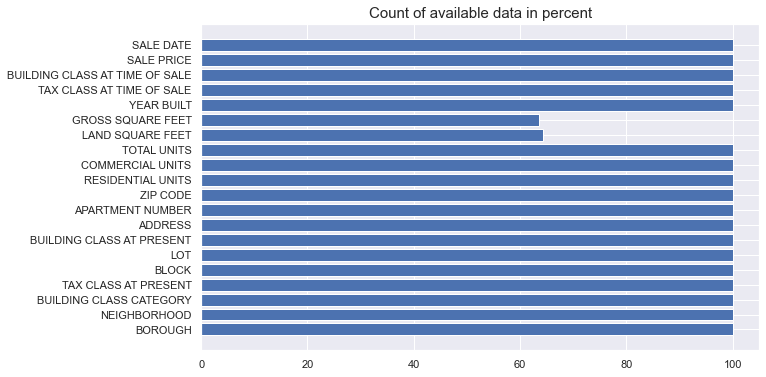

In [44]:
#Plot number of available data per variable
plt.figure(figsize=(10,6))
plt.barh(variables, count_pct)
plt.title('Count of available data in percent', fontsize=15)
plt.show()

before removing any of the rows associated to Gross Sq Feet and Land Square Feet, I want to continue preforming statistical analysis along the price column. 



## Building Age & Sale Price

Is there any coorelation between price and the buildings age? Specifically, what is the coorelation between the sale price and year built. NYC is one of the oldest cities in the United States and therefore, there are many historical skyskrapers, buildings, and properties. I want to see how the age of the property impacts its price...let's use seaborn's regplot...

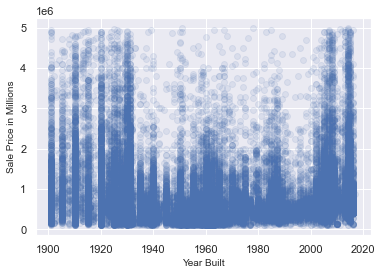

In [45]:
a = sns.regplot(x='YEAR BUILT', y='SALE PRICE', data=df[df['YEAR BUILT']>1900], fit_reg=False, scatter_kws={'alpha':0.1})
a.set_ylabel("Sale Price in Millions", fontsize = 10)
a.set_xlabel("Year Built", fontsize = 10)
plt.savefig('price_yearbuilt_main.jpg')

IMPORTANT DISCOVERY: Properties built before 1940, and after 2000, are higher in price. This can be observed by the darker shading, meaning there are a higher number of expensive transactions above 2M when the property is built before 1940 or after 2000.

I also want to see the above graph with bubble size as a level of detail for gross square feet and land square feet...this can actually help us later IF/WHEN we want to select a specific property to recommend as a purchase for the investor based on it's size....we may be able to spot a 'cheap' property that is very large in size.....IF SO, right now is the time we want to explore this in our data set, before we make any additional changes....I'm also going to store the current df's state as df_one...

In [46]:
len(df)

54579

In [47]:
df_one = df #captured clean at this point in time
len(df_one)
#you should be able to use df_one to export as csv, to observe the below in Tableau 

54579

In [52]:
df_one.to_csv('nyc_price_only_clean2.csv')

Visualizing Year Built, Sale Price, and Gross Square Feet

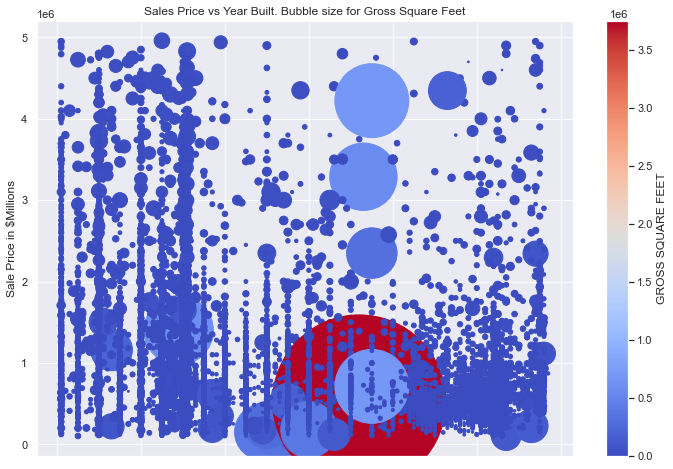

In [48]:
df[df['YEAR BUILT']>1900].plot.scatter(x='YEAR BUILT', y='SALE PRICE', c='GROSS SQUARE FEET', cmap='coolwarm',figsize=(12,8),s=df[df['YEAR BUILT']>1900]['GROSS SQUARE FEET']*.008)
plt.title('Sales Price vs Year Built. Bubble size for Gross Square Feet')
plt.xlabel("Year Built")
plt.ylabel("Sale Price in $Millions")
plt.savefig('salesprice_yearbuilt_gross_sq_feet.jpg')
plt.show()

We use c= to specify the color values.
We use s= to specify the size of the bubbles. 
The chart generated shows a few larger bubbles, meaning those particular properties are larger in gross square feet.
The red bubble at the bottom is the largest property in terms of gross square feet. It is also relatively inexpensive...

okay...this is good....we have identified that there are properties that are large in terms of gross square feet (represented by bubble size) that are also in the 200,000 to 1M price range... further inspection analysis could drill in on the larger bubble sizes as larger properties in terms of gross square footage that are lower in price, and could present a potential purchase recomendation as an investment property....a large number of rental rooms could be converted, etc. the existing data is saved as df_one....this can be exported as a csv so we can drill in further with Tableau to observe specific properties....for now let's continue analysis along the price column...


 let's also look at Price v Year from the prospective of Land Square Feet as the Bubbles....

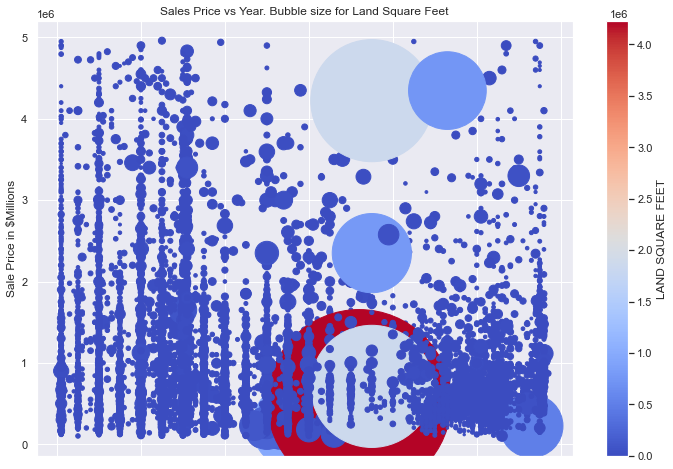

In [49]:
df[df['YEAR BUILT']>1900].plot.scatter(x='YEAR BUILT', y='SALE PRICE', c='LAND SQUARE FEET', cmap='coolwarm',figsize=(12,8),s=df[df['YEAR BUILT']>1900]['LAND SQUARE FEET']*.008)
plt.title('Sales Price vs Year. Bubble size for Land Square Feet')
plt.xlabel("Year Built")
plt.ylabel("Sale Price in $Millions")
plt.savefig('salesprice_yearbuilt_land_sq_feet.jpg')
plt.show()

we see similar results comparativley with respect to Land Square feet....the large bubbles represent specific properties.

Now let's look at Prices over each NYC Borough

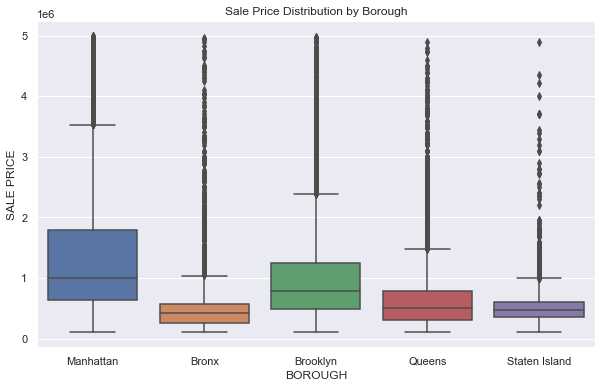

In [50]:
# Sales prices by borough
plt.figure(figsize=(10,6))
sns.boxplot(x='BOROUGH', y='SALE PRICE', data=df)
plt.title('Sale Price Distribution by Borough')
plt.show()

Most expensive properties are located in Manhattan with median sale price of almost exactly 1 million USD for a property. Relatively cheaper properties are in Bronx, Staten Island, and Queens, with Brooklyn being middle tier. In order to view the exact price, we'll need to use Plotly.

No huge surprises here though....it looks like we have cleaned our data well...

Up to this point we've cleaned our data and discovered a coorelation between the age of the property and it's price, specifically properties build before 1940, and after 2000, are higher in price.

we can also see the descriptive statistical box plots across each NYC borough....In order to have a more advanced view into our data, we can leverage the visualization features of Plotly... let's jump into visualizing more specific elements using plotly...

Also, we are going to take advantage of Plotly's timeseries analysis capabilities 

installing kaleido here to save/export images . we also want to visualize these Plotly images in Tableau in the future.

In [63]:
!pip install -U kaleido

In [118]:
###7777 edit pick up point, continue from Dec 22#### put plotly box plot next to show ability...
#in line show mat plot lib BOX graphic, THEN Plotly Graphic...
##the rest of the graphics showing analysis on Price Clean Only should follow along from here
####BEFORE you clean the square footage rows.....

Building the box plot visual in Plotly requires a bit more code than seaborn/matplotlib. but it is definitely worth it for the amount of interactivity we get...

In [51]:
trace0 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH == 'Manhattan' ],
    name = 'Manhattan',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)
trace1 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Bronx' ],
    name = 'Bronx',
    marker = dict(
        color = 'rgb(8,81,156)',
    )
)
trace2 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Brooklyn' ],
    name = 'Brooklyn',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)
trace3 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Queens' ],
    name = 'Queens',
    marker = dict(
        color = 'rgb(12, 128, 128)',
    )
)
trace4 = go.Box(
    y=df['SALE PRICE'][df.BOROUGH ==  'Staten Island' ],
    name = 'Staten Island',
    marker = dict(
        color = 'rgb(12, 12, 140)',
    )
)

dat = [trace0, trace1, trace2, trace3, trace4]
layout = go.Layout(
    title='Housing Prices in Boroughs',
    xaxis=dict(
        title='Borough'
    ),
    yaxis=dict(
        title='Sale Price'
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)'
)

fig = go.Figure(data=dat, layout=layout)
py.iplot(fig)

This looks good. This definietley passes a sanity check when comparing to the matplotlib graph. Plotly is working out rather nicely with this data set...by hovering over the graphics, we can observe descriptive statistics that are unavailable in a standard Matplotlib / Seaborn graphics.

additional interactive exploratory information is available in the Ploty graph (min/max, interquartile ranges, exact median points, exact price of specific outliers, etc)..

## Median Property Price
* Manhattan : 999K
* Brooklyn : 778k
* Queens : 509k
* Staten Island :474k
* Bronx : 420k

## Percentage & Number of Properties in each Borough

Let's take advantage of Plotly's ability to make donut and bar graphs...this will be helpful to visualize our 1.)  Percentage of Properties in each Borough and 2.)Number of properties in each Borough

In [52]:
boroughs = ['Manhattan','Bronx','Brooklyn','Queens','Staten Island']
property_count = []
for b in boroughs:
    property_count.append(len(df.BOROUGH[df.BOROUGH == b]))

fig = {
  "data": [
    {
      "values": property_count,
      "labels": boroughs,
      "hoverinfo":"label+percent",
      "hole": .3,
      "type": "pie"
    }],
  "layout": {
        "title":"Percentage of Properties in Boroughs",
    }
}

py.iplot(fig, filename='donut')





In [53]:
dataa = [go.Bar(
            y= boroughs,
            x = property_count,
            width = 0.7,
            opacity=0.6, 
            orientation = 'h',
            marker=dict(
                color='rgb(158,202,225)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5,
                )
            ),
        )]
layout = go.Layout(
    title='Number of Properties in each Bourough',
    autosize = False,
    width=800,
    height=500,
    margin=go.Margin(
        l=250,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
)

fig = go.Figure(data=dataa, layout = layout)
py.iplot(fig, filename='barplottype')
fig.write_image("bar_nyc.jpg")

C:\Users\samue\anaconda3\lib\site-packages\plotly\graph_objs\_deprecations.py:405: DeprecationWarning:

plotly.graph_objs.Margin is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.layout.Margin




## Building Class
let's take a look at the the building class category...I want to visualize what class do the majority of property sales belong to?

In [54]:
from collections import Counter
# print(Counter(df['BUILDING CLASS CATEGORY']))
c = dict(Counter(df['BUILDING CLASS CATEGORY']))
import operator
sorted_category = sorted(c.items(), key=operator.itemgetter(1))
cat_name  = []
cat_value = []
for tup in sorted_category:
    cat_name.append(tup[0])
    cat_value.append(tup[1])

In [55]:
build_data = [go.Bar(
            y= cat_name,
            x = cat_value,
            width = 0.7,
            opacity=0.6, 
            orientation = 'h',
            marker=dict(
                color='rgb(158,202,225)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5,
                )
            ),
        )]
layout = go.Layout(
    title='What building class do majority of properties belong to?',
    autosize = False,
    width=800,
    height=800,
    margin=go.Margin(
        l=350,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    xaxis=dict(
        title='Number of Properties',
    ),
    yaxis=dict(
        title='Building Class',
    ),
)

fig = go.Figure(data=build_data, layout = layout)
py.iplot(fig, filename='barplottype')

The majority of our Properties in this data set are reseidential, non-commercial (family dwellings and elevator/walk-up apartments)

### Visualizing Neighborhood Distribution: Most Common Neighborhoods in the dataset 

before I remove 33% of the data to do analysis on gross square feet/land square feet, I want to observe the price distribution across the top 20 most common neighborhoods in this data set...I want to visualize the most commonly found neighborhoods in the data set...the higher frequency of trasaction occurance within these neighbordhoods...

In [56]:
from collections import Counter
neighborhoods = list(dict(Counter(df['NEIGHBORHOOD']).most_common(20)).keys())

avg_sale_prices = []
for i in neighborhoods:
    avg_price = np.mean(df['SALE PRICE'][df['NEIGHBORHOOD'] == i])
    avg_sale_prices.append(avg_price)
    
n_data = [go.Bar(
            y= neighborhoods,
            x = avg_sale_prices,
            width = 0.7,
            opacity=0.6, 
            orientation = 'h',
            marker=dict(
                color='rgb(158,202,225)',
                line=dict(
                    color='rgb(8,48,107)',
                    width=1.5,
                )
            ),
        )]
layout = go.Layout(
    title='Average Property Price in the Top 20 Neighborhoods',
    autosize = True,
    margin=go.Margin(
        l=250,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    xaxis=dict(
        title='Sale Price',
    ),
    yaxis=dict(
        title='Neighborhood',
    ),
)

fig = go.Figure(data=n_data, layout = layout)
py.iplot(fig, filename='barplottype')


Among the Top 20 Most Common Neighborhoods, Chelsea and the Upper West Side are the most expensive Neighborhoods. Riverdale and Great Kills are the cheapest...Flushing-North and Bay Ridge are in the middle...

We'll look at Neighborhood selection more in **Tableau**

### Neighborhood Selection Reference, Zoe Goldstein
Neighborhood Selection Reference: 

Zoe Goldstein, NYC real estate writer and Ph.D candidate at Fordham University recommends narrowing property investment through the lense of "tried and true neighborhoods." 

**Upper West Side**: "iconic and not going out of style any time soon."

**Inwood**: "Up and coming or fast-growing; tends to provide higher cap rates and appreciation potential, wherein the celebrated classics provide downside/volatility protection."

**Chelsea**: "is slated to get an increase in supply based on new developments."

[NYC Property Advisory](https://www.propertynest.com/blog/sales/how-buy-investment-property/)



## Timeseries Analysis with Pandas and Plotly
remember we made df['SALE DATE'] as dtype: datetime ....we now use this to drill in on desired time series  elements with Plotly...so let's make a year, month, quarter, day, weekend columns to the pandas dataframe so we can further explore time series visualizations....

In [57]:
df['SALE YEAR']    = df['SALE DATE'].dt.year
df['SALE MONTH']   = df['SALE DATE'].dt.month
df['SALE QUARTER'] = df['SALE DATE'].dt.quarter
df['SALE DAY']     = df['SALE DATE'].dt.day
df['SALE WEEKDAY'] = df['SALE DATE'].dt.weekday

Let's take advantage of Plotly's features to visually analyze the time series data.

### Sales Price in Each Month
let's take a look at sales prices in each month...remember our dataset consists of property transactions from Aug 31 2016 to Aug 30 2017

In [58]:
# Rainbow plot
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, 12)]
data = [{
    'y' : df['SALE PRICE'][df['SALE MONTH'] == ind],
    'type':'box',
    'name' : months[ind - 1],
    'marker':{'color': colors[ind - 1]}
} for ind in range(1,13)]

layout = go.Layout(
    title='Property Prices in each Month',
    xaxis=dict(
        title='Month'
    ),
    yaxis=dict(
        title='Sale Price'
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)'
)

fig = go.Figure(data=data, layout=layout)
#dat = [trace0, trace1, trace2, trace3, trace4]
py.iplot(fig)

the month over month data is rather flat...the highest median is in Aug at 700k..
...May - Aug summer season has a higher median than other seasons...

### Number of Properties Sold in Each Month per Borough
Now let's visualize the number of properties sold in each borough in each month.

In [59]:
df['sp'] = df['SALE PRICE']
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

p = pd.DataFrame(df.groupby(['BOROUGH', 'SALE MONTH']).sp.count()).reset_index()
colors = ['hsl('+str(h)+',50%'+',50%)' for h in np.linspace(0, 360, 12)]

data = [
    {
        'x': months,
        'y': [boroughs[ind]] * 12,
        'showlegend' : False,
        'mode': 'markers',
        'text': [ x for x in p.sp[p.BOROUGH == ind]],
        'marker': {
            'color': colors,
            'size': [(x/np.sum(p.sp[p.BOROUGH == boroughs[ind]])*400) for x in p.sp[p.BOROUGH == boroughs[ind]]],
        }
    } for ind in range(5)
]

layout = go.Layout(
    title='Number of properties sold in each borough in each month',
    xaxis=dict(
        title='Month',
        gridcolor='rgb(255, 255, 255)',
    ),
    yaxis=dict(
        title='Borough',
        gridcolor='rgb(255, 255, 255)',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='temp')

## Cleaning, Analyzing, and Visualizing the Gross Sq Ft and Land Sq Ft Rows

We have conducted basic analysis on price and visualized price coorelations to other variables. Up to this point, we have preformed our analysis WITHOUT removing the 31%+ of data missing in the Gross Sq feet and Land Sq feet rows...Our primary reason for this is that we wanted to keep those price rows to preform analysis with as much of the price data as possible.

At this juncture, I've decided on an approach on how to handle the missing Gross Sq feet and Land Sq feet rows....Now that we have finished the analysis on price, we can drop the missing values in Gross Sq feet and Land Sq feet rows to conduct further exploratory analysis on Gross Sq feet and Land Sq feet.. I have also saved the dataframe up to this point with the clean pricing data alone, (saved as df_one), so we can revisit that particular dataset in Tableau later. Remember, Tableau will allow us to work with multiple dataset plug ins.

lets reinspect how many missing values we are dealing with along the Gross Sq feet and Land Sq feet columns....remember we already dropped rows with missing 'price' values...and some of those rows also had missing sq feet values...so lets reinspect how many missing square footage values we have again....

In [60]:
#we'll make changes to df
len(df)

54579

<AxesSubplot:>

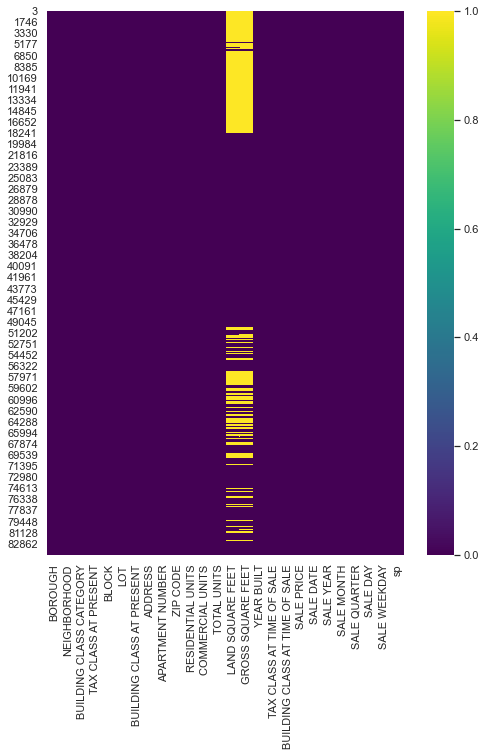

In [61]:
#let's revisit how many missing values we have now...
plt.figure(figsize=(8,10))
sns.heatmap(df.isnull(),cmap='viridis')

...hmmm...it looks like it's actually a lot...let's see the actual numbers...another approach would be to replace the missing values with the average...(which could be done in later iteration)...for now let's see what the percentage of missing values there are....

In [62]:
missing1 = df.isnull().sum()/len(df)*100

#if missing values exist, print the number and % it represents of its total
print(pd.DataFrame([missing1[missing1>0],pd.Series(df.isnull().sum()[df.isnull().sum()>1000])], index=['percent missing','total missing']))

                 LAND SQUARE FEET  GROSS SQUARE FEET
percent missing         35.671229          36.416937
total missing        19469.000000       19876.000000


wow...it's over one-third of our existing data set......35% for Land Square Feet and 36% for Gross Square Feet...

defining land square feet and gross square feet.
land square feet can be thought of 'how much land is surrounding the property'.
gross square feet can be though of as 'total area of all floors, even if they are in the sky..such as in a skyscraper'

this is why Manhattan has the highest gross square feet...in Manhattan you are paying for property that is listed in the sky...thus the term 'sky scraper'

we will now move into our analysis of gross square feet and land square feet...remember the misssing values are over 30%...so I want to save the dataframe in it's current state before I preform further operations...

In [63]:
df_7a_state = df

In [64]:
len(df_7a_state)

54579

In [107]:
df_7a_state.to_csv('nyc_price_only_clean.csv')

In [65]:
len(df)

54579

54,579 rows before dropping missing values for land sq feet and gross sq feet

now we are going to drop those missing values...

In [66]:
# Removes all NULL values
# we'll call it df_sq_clean
df_sq = df[df['LAND SQUARE FEET'].notnull()] 
df_sq_clean = df_sq[df_sq['GROSS SQUARE FEET'].notnull()]

In [67]:
len(df_sq_clean)

34702

looks correct, we removed 20k rows...

now let's do some analysis with df_sq_clean 

In [68]:
df_sq_clean.describe()

,BLOCK,LOT,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,SALE PRICE,SALE YEAR,SALE MONTH,SALE QUARTER,SALE DAY,SALE WEEKDAY,sp
count,34702.000000,34702.000000,34702.000000,34702.000000,34702.000000,34702.000000,3.470200e+04,3.470200e+04,34702.000000,3.470200e+04,34702.000000,34702.000000,34702.000000,34702.000000,34702.000000,3.470200e+04
mean,5256.461184,225.361708,10966.167454,1.721860,0.156446,1.880439,2.829378e+03,2.072324e+03,1856.370382,7.958546e+05,2016.655438,6.568065,2.501614,16.571235,2.140856,7.958546e+05
std,3632.627633,476.551691,974.267934,11.360757,12.186953,16.728840,2.822672e+04,2.212197e+04,410.264002,6.532387e+05,0.475232,3.449357,1.116114,8.828513,1.389209,6.532387e+05
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,1.007000e+05,2016.000000,1.000000,1.000000,1.000000,0.000000,1.007000e+05
25%,2336.250000,21.000000,10469.000000,1.000000,0.000000,1.000000,1.358000e+03,8.722500e+02,1920.000000,4.157465e+05,2016.000000,4.000000,2.000000,9.000000,1.000000,4.157465e+05
50%,4836.000000,45.000000,11219.000000,1.000000,0.000000,1.000000,2.190000e+03,1.520000e+03,1935.000000,6.150000e+05,2017.000000,6.000000,2.000000,17.000000,2.000000,6.150000e+05
75%,7360.000000,96.000000,11361.000000,2.000000,0.000000,2.000000,3.139750e+03,2.250000e+03,1963.000000,9.300000e+05,2017.000000,10.000000,4.000000,24.000000,3.000000,9.300000e+05
max,16319.000000,7501.000000,11694.000000,1844.000000,2261.000000,2261.000000,4.228300e+06,3.750565e+06,2017.000000,4.986410e+06,2017.000000,12.000000,4.000000,31.000000,6.000000,4.986410e+06


after dropping missing values...there are still properties that have 0 square feet...which shouldn't be possible unless the property does not exist...the 0 values need to be dealt with...(plotly will actually work around these zero values well with it's built in methods for visualizing descriptive statistics...this is observed later...)

...let's use some of the same graphics we used to observe SALE PRICE, but now to look at LAND SQUARE FEET and GROSS SQUARE FEET...we need to clean any significant outliers....

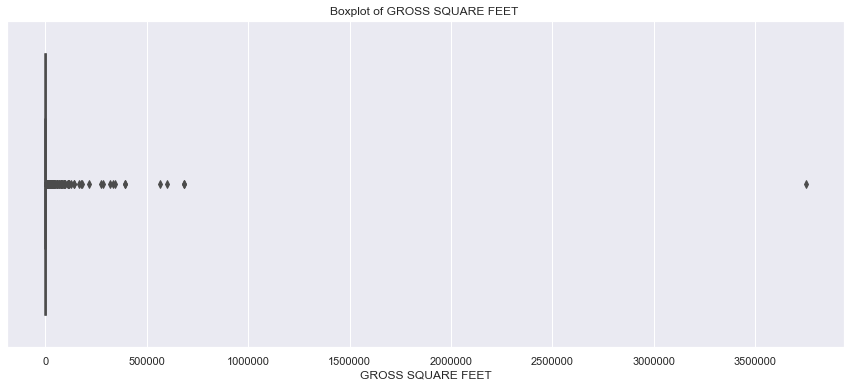

In [69]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.boxplot(x='GROSS SQUARE FEET', data=df_sq_clean)
plt.ticklabel_format(style='plain', axis='x')
plt.title('Boxplot of GROSS SQUARE FEET ')
plt.show()

...there is one high outlier...above 3.5M...that may be attributed to an entire building sale, but we can't say conclusively...also three above 500k...majority seem to be under 250k but we need to see a distplot to understand where to zoom in closer...we need to discover where the univariate distribution is again...

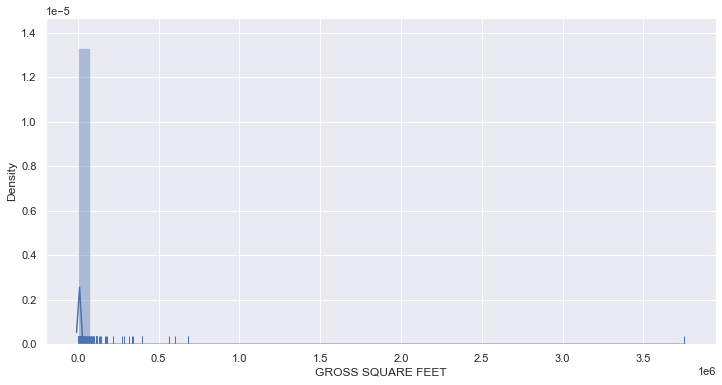

In [70]:
plt.figure(figsize=(12,6))
sns.distplot(df_sq_clean['GROSS SQUARE FEET'], kde=True, bins=50, rug=True)
plt.show()

...this looks similar to what we saw with the price data before, just not quite as pronounced...the bottom end of the KDE (the spike in the picture) after a few iterations was disoverd to reveal more insight when zooming in under 50k...let's use the same code we used on the pricing data to zoom in on GROSS SQUARE FEET...in this case anything under 50,000...

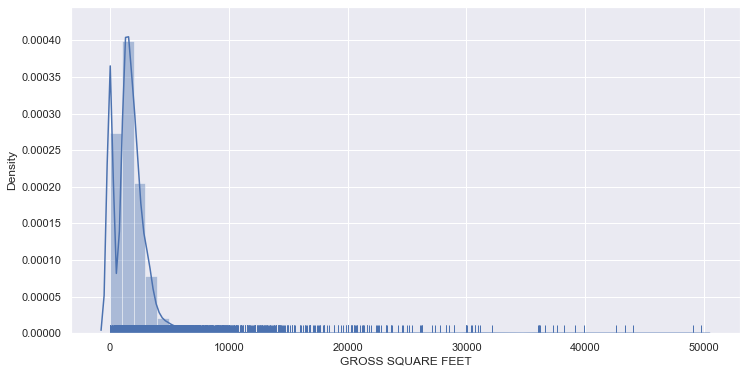

In [71]:
df5gr= df_sq_clean[(df_sq_clean['GROSS SQUARE FEET']<50000)]
plt.figure(figsize=(12,6))
sns.distplot(df5gr['GROSS SQUARE FEET'], kde=True, bins=50, rug=True)
plt.show()

...looks like the majority are under 10k, however many that are actually zero itself...

let's observe under 10k

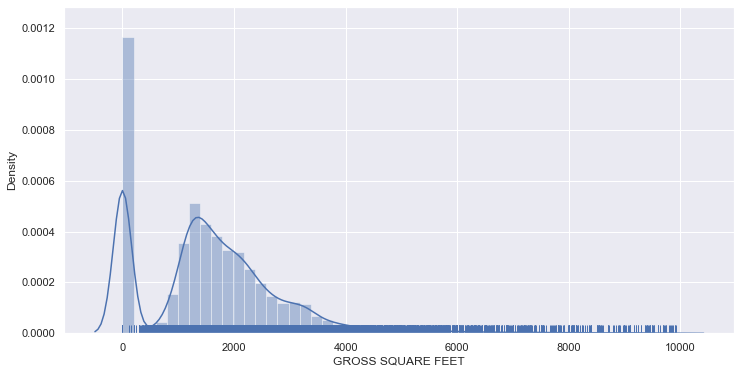

In [72]:
df10gr= df_sq_clean[(df_sq_clean['GROSS SQUARE FEET']<10000)]
plt.figure(figsize=(12,6))
sns.distplot(df10gr['GROSS SQUARE FEET'], kde=True, bins=50, rug=True)
plt.show()

it looks like a right skewed normal distribution (between 800 - 4000)

let's try to visualize this another way....we really need to rely on python visualization at this point to drill in on GROSS SQUARE FEET...


...let's view GROSS SQUARE FEET with SALE PRICE in a scatter plot..

SOMETIMES YOU HAVE TO VIEW IT A COUPLE DIFFERENT WAYS TO FINALLY SEE WHAT'S GOING ON

## PRIME STAGE
remove anyting over 20,000 sq feet

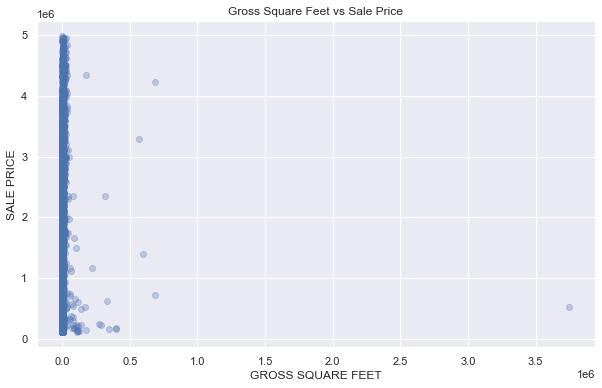

In [73]:
#scatter plot of gross square feet and sale price
plt.figure(figsize=(10,6))
sns.regplot(x='GROSS SQUARE FEET', y='SALE PRICE', data=df_sq_clean, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Gross Square Feet vs Sale Price')
plt.show()

hmmm....this reg plot is not very helpful...we need to zoom in closer to the normal distribution (800-4000 as discovered in the seaborn displot)....according to the rug map in the second sns distplot above, there was very little distribution above 20,000 gross square feet... let's zoom in to only check anything up to 20,000 sq feet...but not over 20,000 sq feet...

In [74]:
# Keeps properties with fewer than 20,000 Square Feet, which is about 2,000 Square Metres
df_sq_clean2 = df_sq_clean[df_sq_clean['GROSS SQUARE FEET'] < 20000]
df_sq_clean2 = df_sq_clean2[df_sq_clean2['LAND SQUARE FEET'] < 20000]

In [75]:
len(df_sq_clean2)

34519

from 34,702 to now 34,519, we dropped about 200 outliers over 20,000 sq. feet...not bad...lets re-run the scatter plot now...

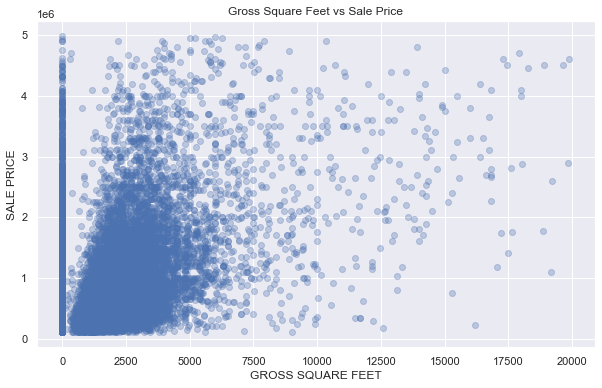

In [76]:
#scatter plot of gross square feet and sale price
plt.figure(figsize=(10,6))
sns.regplot(x='GROSS SQUARE FEET', y='SALE PRICE', data=df_sq_clean2, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Gross Square Feet vs Sale Price')
plt.savefig('price_gross_sq_feet_linear.jpg')
plt.show()

IMPORTANT DISCOVERY...perfect...now we can actually see how GROSS SQUARE FEET is related to the price....this is an extremely helpful visual. it looks like we have a visual that identifies a linear relationship between Gross Sq. Feet and Sale Price. This can be observed by the cluster of data under 5000 on the X axis and under 3M on the Y axis. It looks like we may actually be able to cut a line through the data. In order to test for this linear relationship, we can build a coorelation Matrix. Let's do that in a bit, after checking the relationship between Sale Price and Land Sq Feet.


(there are still several zero values...however Ploty will naturally adjust for these zero values and still give use a clean average when we get to the point of building the bubble graphs....)

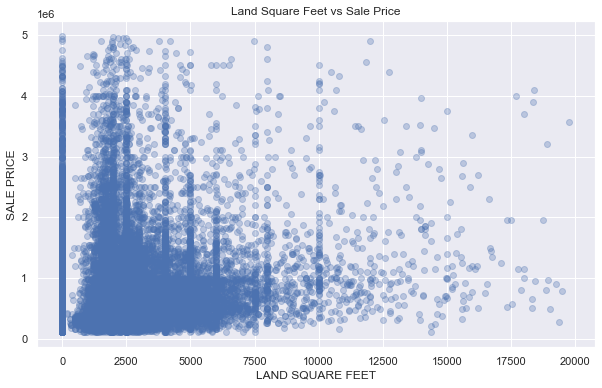

In [77]:
#scatter plot of land square feet and sale price
plt.figure(figsize=(10,6))
sns.regplot(x='LAND SQUARE FEET', y='SALE PRICE', data=df_sq_clean2, fit_reg=False, scatter_kws={'alpha':0.3})
plt.title('Land Square Feet vs Sale Price')
plt.savefig('price_land_sq_feet.jpg')
plt.show()

...hmmm...the relationship between gross square feet 'looks' to be more linear than land square feet from a quick observation....land square feet is more sporatic...lets build a corrlation matrix to test this case further....

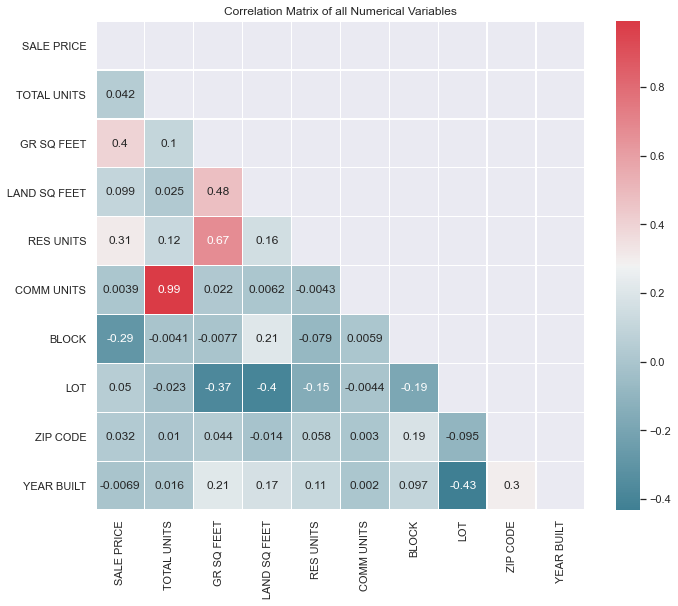

In [78]:
# Compute the correlation matrix
d= df_sq_clean2[['SALE PRICE', 'TOTAL UNITS','GROSS SQUARE FEET',  'LAND SQUARE FEET', 'RESIDENTIAL UNITS', 
         'COMMERCIAL UNITS', 'BOROUGH', 'BLOCK', 'LOT', 'ZIP CODE', 'YEAR BUILT',]]

# make the name smaller so the saved image can fit into a Tableau story
d.columns = ['SALE PRICE', 'TOTAL UNITS', 'GR SQ FEET', 'LAND SQ FEET',
       'RES UNITS', 'COMM UNITS', 'BOROUGH', 'BLOCK', 'LOT',
       'ZIP CODE', 'YEAR BUILT'] 

corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.savefig('correlation_matrix.jpg')
plt.show()

gross square feet has the highest coorelation to sales price, of any other variable, with the Coorelation Coefficient value of 0.4. This is also know as the Pearson's coorelation...thus the most linear relationship...

I feel comfortable that we can give gross square feet more attention in terms of impact towards pricing, rather than land square feet . Land square feet holds the Pearson's coorelation of 0.099. The land square feet values seem more sporatic and non-linear in this data set...

Another data analysis subset within this project could include further exploring Residential Units with the Coorelation Coeficient value of 0.31. a hypothesis from the following article is that the more gross square feet available, the more number of rooms are available...
[NYC Property Investment Advisory](https://www.propertynest.com/blog/sales/how-buy-investment-property/)Quote:"Remember: rent in NYC is determined by number of bedrooms, not the size of bedrooms!"

* the hypothesis submitted from this coorelations is simply that the more gross square feet avialable (value of 0.4) the more **Number of Bedrooms** an investment property can hold. More analysis can be conducted on the relationship between: Gross Square Feet, Residential Units, Number of Rooms Available.

### Visualizing Avg Land Sq. Feet and Avg Gross Sq. Feet per Borough

In [79]:
# average LAND SQUARE FEET in each borough box plot
d3 = pd.DataFrame(df_sq_clean2.groupby(['BOROUGH']).mean()).reset_index()
d3['BOROUGH'][d3['BOROUGH'] == 1] = 'Manhattan'
d3['BOROUGH'][d3['BOROUGH'] == 2] = 'Bronx'
d3['BOROUGH'][d3['BOROUGH'] == 3] = 'Brooklyn'
d3['BOROUGH'][d3['BOROUGH'] == 4] = 'Queens'
d3['BOROUGH'][d3['BOROUGH'] == 5] = 'Staten Island'
total = d3['LAND SQUARE FEET'].sum()
trace0 = go.Scatter(
    x=d3['BOROUGH'],
    y=d3['LAND SQUARE FEET'],
    mode='markers',
    marker=dict(
        size=[((x/total)*300) for x in d3['LAND SQUARE FEET']],
        color=['rgb(93, 164, 214)', 'rgb(255, 144, 14)',  'rgb(44, 160, 101)', 'rgb(255, 65, 54)', 'rgb(255, 15, 54)'],
    )
)

data = [trace0]
layout = go.Layout(
    title='Average Land square feet of properties in each Borough',
    xaxis=dict(
        title='Borough',
        gridcolor='rgb(255, 255, 255)',
    ),
    yaxis=dict(
        title='Land square feet',
        gridcolor='rgb(255, 255, 255)',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='bubblechart-size')

there is more open land space per property in Staten Island and Queens...that means there is more land (rural) space in Staten Island/Queens than the other Boroughs....

In [80]:
# average GROSS SQUARE FEET in each borough box plot
total = d3['GROSS SQUARE FEET'].sum()
trace0 = go.Scatter(
    x=d3['BOROUGH'],
    y=d3['GROSS SQUARE FEET'],
    mode='markers',
    marker=dict(
        size=[((x/total)*300) for x in d3['GROSS SQUARE FEET']],
        color=['rgb(93, 164, 214)', 'rgb(255, 144, 14)',  'rgb(44, 160, 101)', 'rgb(255, 65, 54)', 'rgb(255, 15, 54)'],
    )
)

layout = go.Layout(
    title='Average Gross square feet in each Borough',
    xaxis=dict(
        title='Boroughs',
    ),
    yaxis=dict(
        title='Average gross square feet',
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
)


data = [trace0]
fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='gross-square-feet-borough-bubble-chart')
fig.write_image("gross_sq_borough_circle.jpg")
# plotly to Tableau ..... plt.savefig('gross_sq_borough.jpg')

as we look to Gross Square Feet (including building levels/sky scraper space) Manhattan has the highest average Gross Square Feet...

...Manhattan is clearly the king of the sky...the highest average gross square feet because additional gross square footage is located in the sky...in skyscrapers...

## Gross Square Feet Definition from the documentaion:

Gross Square Feet:
The total area of all the floors of a building as measured from the exterior surfaces of the
outside walls of the building, including the land area and space within any building or structure
on the property. 

this Jupyter Notebook has served in Exploratory Analysis, Data Visualization, and Data Cleaning.
We have also discoved a few keen insights that will be finally presented in Tableau. 


to finish the analysis stage, next I plan to :

* 1.) export a csv file of the data with the clean SALES PRICE column (before we dropped rows containing NA values for gross square feet and land square feet.) 
* 2.) export a csv file of the data with the clean Gross Square Feet column
* **3.)** **view the **csv data in Tableau** to find i.property **in manhatann built before 1940 OR after 2000 that is in the 4,700+ gross square feet range.** these are prime properties. **(look for price matching criteria under the median $990k.
* 3.) **observe the pricing in Tableau of properties in Manhattan Neighborhoods**
* 4.)from there, **recommend 1 top property in Manhattan** as a purchase recommendation based on i.)price for Neighborhood average ii.)gross square feet iii.)location in manhattan iv.)age of building. 
* 5.) observe properties in Manhattan contained under 1M with gross square feet above the average of 4,700...are there any significantly good property deals we can discovery in Manhatten from this data set?

AFTER preforming the above analysis, the final Tableau Presentation can be found submitted here:
[Samuel Prince Springboard Capstone II Tableau Presentation](https://public.tableau.com/app/profile/samuel.prince/viz/CapstoneII_16397039707410/Story2) 

*below notes kept as a sanity check reference for the zero values. Plotly produced the same visual/average results with the zero values and without the zero values....you do no need to remove the zero values in gross square feet or land square feet....*

what would happen if we removed all 0 values...would that change the average output we see in Plotly? let's see...

In [81]:
len(df_sq_clean2[df_sq_clean2['GROSS SQUARE FEET'] > 0])

26567

from 34,519 to 26,567

In [82]:
 34519 - 26567

7952

we loose 8k rows...

out of curisoity, I want to see how the above 3 charts are changed by dropping all zero values....

In [ ]:
df_sq_clean3 = df_sq_clean2[df_sq_clean2['GROSS SQUARE FEET'] > 0]

In [ ]:
len(df_sq_clean3)

..,.the graphical sanity check was preformed and it was discovered that Plotly already took care of the 8k zero values....the Gross Sq. Feet per Borough graphic is accurate with the data cleaned to the degree that it is...you do no need to remove the zero values in gross square feet or land square feet....